In [247]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
from pandas_datareader import data as pdr
import yfinance as yf
import seaborn as sns
yf.pdr_override()

from sklearn.feature_selection import SelectKBest, f_regression

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# prepare data

In [248]:
capital = 1e5
start_date = dt.datetime(2004,11,1)
end_date = dt.datetime(2023,11,1)
spy = pdr.get_data_yahoo("SPY", start = start_date, end = end_date)

Y = np.log(spy["Adj Close"]).diff(1).shift(-1)            
Y.name = "Y_pred"

tnx_ticker = "^TNX" # CBOE 10 Year Treasury Note Yield Index
tnx_data = yf.download(tnx_ticker, start=start_date, end=end_date)

X1 = np.log(tnx_data['Adj Close'])
X1 = X1.ffill()
X1.name='10years futures'

vix_ticker = "^VIX"
vix = yf.download(vix_ticker, start=start_date, end=end_date)
X2 = np.log(vix['Adj Close'])
X2 = X0_1.ffill()
X2.name='vix'

X3 = np.log(spy['Volume'])

X4 = pd.concat([X1.shift(i) for i in [3,6,12]], axis=1)
X4.columns = ["Volume_3", "Volume_6", "Volume_12"]

X5 = pd.concat([Y.diff(i) for i in [3,6,12]], axis=1)
X5.columns = ["SPY_3", "SPY_6", "SPY_12"]

X = pd.concat([X0, X0_1, X1, X2, X3], axis=1)

X_traintest = X.loc[pd.to_datetime('2004-11-17'):]
X_traintest = X_traintest.ffill()

Y_traintest = Y.loc[pd.to_datetime('2004-11-17'):]

Y_traintest_binary = (Y_traintest > 0).astype(int)
index_ = Y_traintest_binary.index

[*********************100%***********************]  1 of 1 completed


# Feature Engineering

In [295]:
# - original x var = 9
# - degree-1 term = 9
# - degree-2 terms 
#     - 9
#     - interaction 9C2 = 36
# - degree-3 terms
#     - 9
#     - 9C3 = 84
#     - degree-2 term + other degree-1 term = 9 * 8 = 72
# - constant term = 1

# - 9(original)+9(squared)+36(pairwise)+9(cubed)+84(three-way)+72(squared-other)+1(constant)=220

In [ ]:
def get_polynomial_features(X_traintest, Y_traintest, *args):
    
    k = arg[0] if args else "all"
    
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=3)
    X_poly = poly.fit_transform(X_traintest)

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12'])
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
    X_poly_df.index = index_
    
    selector = SelectKBest(score_func=f_regression, k=k) 

    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)

In [ ]:
#for long-only strategy, overfit

def optimise1(X_traintest, Y_traintest, res = res1, degree=3, k=10, penalty_=0, solver= 'saga', capital = 100000): 
    
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X_traintest)
    
    index_ = X_traintest.index

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12']) 
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names, index = index_)
    
     # select the top 10 features based on the F-scores
    selector = SelectKBest(score_func=f_regression, k=k) 
    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)
    
    LN = LinearRegression()
    LN.fit(X_selected_df, Y_traintest_binary)
    LN_pred_train = LN.predict(X_selected_df)
    LN_pred_train_df = pd.DataFrame(LN_pred_train, columns = ['predicted'], index = index_) 

    Y_pred_binary = (LN_pred_train_df > 0).astype(int)
    
    if len(Y_pred_binary['predicted'].unique()) == 1:
        return print("Combination: degree = {degree}, polynomial HP {k}, regularization's L1ratio {penalty_}, output only has 1 class of predictions!".format(degree, k, penalty_))
    
    logreg_sk = LogisticRegression(penalty='elasticnet', l1_ratio=penalty_, solver=solver)
    
    logreg_sk.fit(X_selected_df, Y_pred_binary)
    
    Y_pred_logistic = logreg_sk.predict(X_selected_df)

    Y_pred_logistic_df = pd.DataFrame(Y_pred_logistic, columns=['predicted'])
    Y_pred_logistic_df.index = index_
    
    X_traintest2 = X.iloc[12:].copy()
    X_traintest2["signal"] =  Y_pred_logistic_df
    #X_traintest2 = X_traintest2.loc[pd.to_datetime('2004-11-17'):]
    #X_traintest2 = X_traintest2.ffill()
    
    X_traintest2['strategy_return'] = X_traintest2["signal"] * Y
    X_traintest2['strategy_account'] = X_traintest2['strategy_return'].cumsum().apply(np.exp) * capital
    X_traintest2['passive_account'] = Y.cumsum().apply(np.exp) * capital

    balance = X_traintest2['strategy_account'].dropna()[-1]
    res.loc[len(res)] = [balance, degree, k, penalty_]

In [ ]:
#for long-short strategy, overfit

def optimise2(X_traintest, Y_traintest, long_short = True, res = None, degree=3, k=10, penalty_=0, solver= 'saga', capital = 100000): 
        
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X_traintest)
    
    index_ = X_traintest.index

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12']) 
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names, index = index_)
    
     # select the top 10 features based on the F-scores
    selector = SelectKBest(score_func=f_regression, k=k) 
    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)
    
    LN = LinearRegression()
    LN.fit(X_selected_df, Y_traintest_binary)
    LN_pred_train = LN.predict(X_selected_df)
    LN_pred_train_df = pd.DataFrame(LN_pred_train, columns = ['predicted'], index = index_) 
    Y_pred_binary = (LN_pred_train_df > 0).astype(int)
    
    if len(Y_pred_binary2['predicted'].unique()) == 1:
        return print("Combination: degree = {degree}, polynomial HP {k}, regularization's L1ratio {penalty_}, output only has 1 class of predictions!".format(degree, k, penalty_))
    
    logreg_sk = LogisticRegression(penalty='elasticnet', l1_ratio=penalty_, solver=solver)
    
    logreg_sk.fit(X_selected_df, Y_pred_binary)
    
    Y_pred_logistic = logreg_sk.predict(X_selected_df)
    
    if long_short: 
        signal = Y_pred_logistic
        short_signal = (signal == 0) * -1 
        signals = short_signal + signal

    Y_pred_logistic_df = pd.DataFrame(Y_pred_logistic, columns=['predicted'])
    Y_pred_logistic_df.index = index_
    
    X_traintest3 = X.iloc[12:].copy()
    X_traintest3["signal"] = signals
    #X_traintest3 = X_traintest3.loc[pd.to_datetime('2004-11-17'):]
    #X_traintest3 = X_traintest3.ffill()
    
    X_traintest3['strategy_return'] = X_traintest3["signal"] * Y
    X_traintest3['strategy_account'] = X_traintest3['strategy_return'].cumsum().apply(np.exp) * capital
    X_traintest3['passive_account'] = Y.cumsum().apply(np.exp) * capital

    balance = X_traintest3['strategy_account'].dropna()[-1]
    res.loc[len(res)] = [balance, degree, k, penalty_]

In [261]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=3)
X_poly = poly.fit_transform(X_traintest)

feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12'])
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
X_poly_df.index = index_

In [263]:
selector = SelectKBest(score_func=f_regression, k=10) 
# select the top 10 features based on the F-scores

X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
X_columns = selector.get_feature_names_out()
X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)


In [264]:
X_selected_df

,SPY_3,SPY_6,SPY_12,Volume SPY_12,SPY_12 Volume_3,SPY_12 Volume_6,SPY_12 Volume_12,Volume^2 SPY_12,Volume SPY_12 Volume_3,Volume SPY_12 Volume_6
Date,,,,,,,,,,
2004-11-17,-1.105130e-03,5.789659e-04,9.961571e-04,0.017745,0.017765,0.017547,0.017352,0.316105,0.316456,0.312573
2004-11-18,-3.994520e-03,-1.875922e-02,-2.369397e-02,-0.409353,-0.411785,-0.417679,-0.422810,-7.072265,-7.114286,-7.216100
2004-11-19,-1.162899e-03,-3.101742e-03,-8.804515e-03,-0.156805,-0.154124,-0.153634,-0.159879,-2.792633,-2.744887,-2.736166
2004-11-22,1.757580e-04,-9.293719e-04,-4.718938e-03,-0.082305,-0.084061,-0.084155,-0.084135,-1.435522,-1.466151,-1.467781
2004-11-23,1.354641e-02,9.551891e-03,3.817622e-03,0.067009,0.065956,0.066348,0.068577,1.176164,1.157686,1.164564
2004-11-24,-5.518327e-03,-6.681226e-03,1.205340e-03,0.020741,0.021467,0.021100,0.020898,0.356899,0.369387,0.363071
2004-11-26,-6.097476e-03,-5.921718e-03,-5.342752e-03,-0.088452,-0.093185,-0.095174,-0.094110,-1.464376,-1.542736,-1.575653
2004-11-29,-1.688490e-03,1.185792e-02,-6.901299e-03,-0.123767,-0.121135,-0.119232,-0.121656,-2.219631,-2.172417,-2.138288
2004-11-30,1.206311e-02,6.544786e-03,3.443044e-03,0.061282,0.059246,0.061319,0.060079,1.090728,1.054501,1.091399


# select model - elasticNet + logisticRegression, long only

- elastic net
    - elastic net is a regularisation technique that is a balance between ridge (L2) regularisation and lasso (L1) regularisation
        - L2: square-of-coefficient penalty, prevent overfitting by shrinking coef, but dont set coefficients to 0
        - L1: ab-of-coef penalty, can set coef to 0, but poor perform against highly correlated var
    - l1_ratio: in this case, lower l1_ratio is better because: 
        - the X_selected_df vars are highly correlated
        - to keep all 10 features done from k-means
        
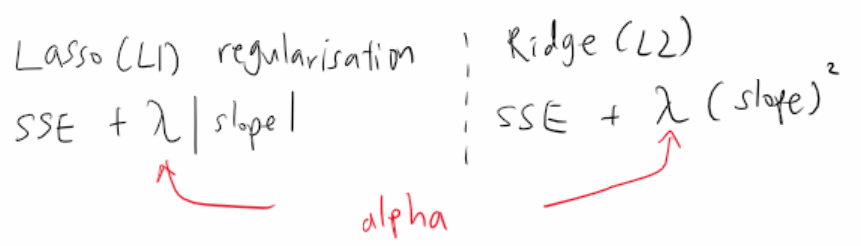

<Axes: >

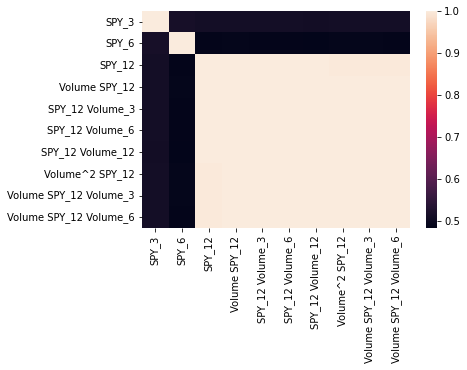

In [265]:
sns.heatmap(X_selected_df.corr())

In [266]:
from sklearn.linear_model import ElasticNet
penalty_ = 0
elastic_net = ElasticNet(alpha=0.1, l1_ratio= penalty_)
elastic_net.fit(X_selected_df, Y_traintest_binary)

ElasticNet(alpha=0.1, l1_ratio=0)

In [267]:
elastic_net.coef_

array([0.01906681, 0.0199621 , 0.00146419, 0.01433853, 0.01399887,
       0.01368381, 0.01307982, 0.01671558, 0.01072411, 0.0053415 ])

In [268]:
elastic_net.intercept_

0.5468336226332684

In [269]:
EN_pred_train2 = elastic_net.predict(X_selected_df)

In [270]:
EN_pred_train2_df = pd.DataFrame(EN_pred_train2, columns = ['predicted'])
EN_pred_train2_df.index = index_

In [271]:
Y_pred_binary2 = (EN_pred_train2_df > 0 ).astype(int)

In [272]:
from sklearn.linear_model  import LogisticRegression
logreg_sk2 = LogisticRegression(penalty='elasticnet', l1_ratio=penalty_, solver='saga')
logreg_sk2.fit(X_selected_df, Y_pred_binary2)
print(logreg_sk2.coef_)
print(logreg_sk2.intercept_)

[[-0.00080196 -0.00015187 -0.00156235 -0.01338201 -0.01065278 -0.0116746
  -0.01352789  0.05589404  0.10649978  0.08519033]]
[4.59910055]


In [273]:
Y_pred_logistic2 = logreg_sk2.predict(X_selected_df)

Y_pred_logistic2_df = pd.DataFrame(Y_pred_logistic2, columns=['predicted'])
Y_pred_logistic2_df.index = index_

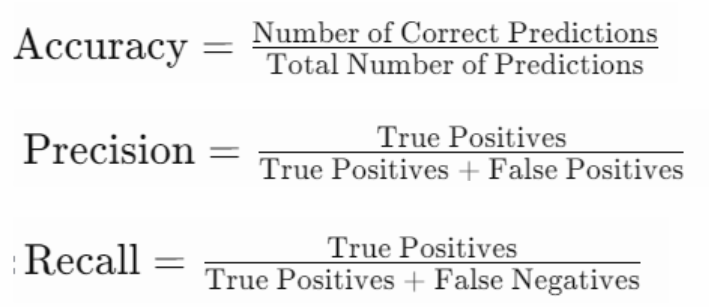

In [274]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error
print(metrics.accuracy_score(Y_traintest_binary,Y_pred_logistic2_df))
print(metrics.precision_score(Y_traintest_binary,Y_pred_logistic2_df))
print(metrics.recall_score(Y_traintest_binary,Y_pred_logistic2_df))

0.5537623139802976
0.5509083227714406
0.9988510149368058


In [275]:
Y_traintest_binary.value_counts()

Y_pred
1    2611
0    2160
Name: count, dtype: int64

In [276]:
Y_pred_logistic2_df.value_counts()

predicted
1            4734
0              37
Name: count, dtype: int64

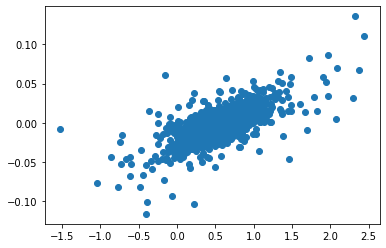

In [277]:
plt.scatter(EN_pred_train2, Y_traintest)

# positive linear relationship predictions are close to actual values

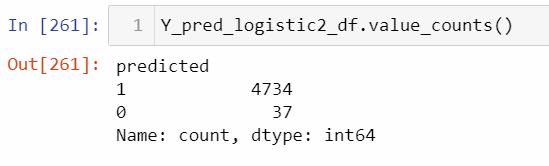

Y_pred_logistic2_df has mostly 1 and this is weird. In comparison, Y_traintest_binary has about 50% 1

In [278]:
X_traintest

,10years futures,vix,Volume,SPY_3,SPY_6,SPY_12,Volume_3,Volume_6,Volume_12
Date,,,,,,,,,
2004-11-17,1.421662,2.580974,17.813601,-1.105130e-03,5.789659e-04,9.961571e-04,17.833401,17.614546,17.418857
2004-11-18,1.415125,2.563410,17.276683,-3.994520e-03,-1.875922e-02,-2.369397e-02,17.379334,17.628054,17.844605
2004-11-19,1.434132,2.602690,17.809602,-1.162899e-03,-3.101742e-03,-8.804515e-03,17.505107,17.449490,18.158799
2004-11-22,1.426716,2.562639,17.441456,1.757580e-04,-9.293719e-04,-4.718938e-03,17.813601,17.833401,17.829193
2004-11-23,1.431268,2.539237,17.552437,1.354641e-02,9.551891e-03,3.817622e-03,17.276683,17.379334,17.963194
2004-11-24,1.433893,2.543176,17.207492,-5.518327e-03,-6.681226e-03,1.205340e-03,17.809602,17.505107,17.337857
2004-11-26,1.444091,2.547881,16.555557,-6.097476e-03,-5.921718e-03,-5.342752e-03,17.441456,17.813601,17.614546
2004-11-29,1.465568,2.587764,17.933910,-1.688490e-03,1.185792e-02,-6.901299e-03,17.552437,17.276683,17.628054
2004-11-30,1.472013,2.583243,17.798648,1.206311e-02,6.544786e-03,3.443044e-03,17.207492,17.809602,17.449490


In [279]:
X_traintest3 = X.copy()
X_traintest3["signal"] =  Y_pred_logistic2_df
X_traintest3 = X_traintest3.loc[pd.to_datetime('2004-11-17'):]
X_traintest3 = X_traintest3.ffill()
print(X_traintest3.shape)
print(X_traintest3.isna().sum())

(4771, 10)
10years futures    0
vix                0
Volume             0
SPY_3              0
SPY_6              0
SPY_12             0
Volume_3           0
Volume_6           0
Volume_12          0
signal             0
dtype: int64


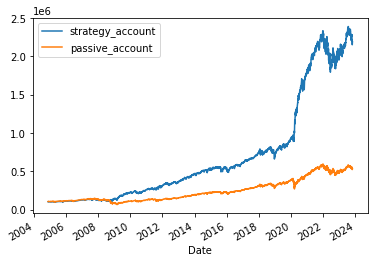

In [280]:
X_traintest3['strategy_return'] = X_traintest3["signal"] * Y
capital = 100000
X_traintest3['strategy_account'] = X_traintest3['strategy_return'].cumsum().apply(np.exp) * capital
X_traintest3['passive_account'] = Y.cumsum().apply(np.exp) * capital


fig, ax1 = plt.subplots()
X_traintest3['strategy_account'].plot(ax=ax1, label='strategy_account')
X_traintest3['passive_account'].plot(ax=ax1, label='passive_account')
ax1.legend()

In [281]:
X_traintest3['strategy_account']

Date
2004-11-17    1.001350e+05
2004-11-18    9.902177e+04
2004-11-19    9.949402e+04
2004-11-22    9.964581e+04
2004-11-23    9.988197e+04
2004-11-24    9.980603e+04
2004-11-26    9.935067e+04
2004-11-29    9.941812e+04
2004-11-30    1.005482e+05
2004-12-01    1.006325e+05
2004-12-02    1.005650e+05
2004-12-03    1.005313e+05
2004-12-06    9.959524e+04
2004-12-07    1.001771e+05
2004-12-08    1.005313e+05
2004-12-09    1.006325e+05
2004-12-10    1.015095e+05
2004-12-13    1.018638e+05
2004-12-14    1.019396e+05
2004-12-15    1.018806e+05
2004-12-16    1.012011e+05
2004-12-17    1.012265e+05
2004-12-20    1.020060e+05
2004-12-21    1.022517e+05
2004-12-22    1.023279e+05
2004-12-23    1.021162e+05
2004-12-27    1.026753e+05
2004-12-28    1.028279e+05
2004-12-29    1.026330e+05
2004-12-30    1.024127e+05
2004-12-31    1.019298e+05
2005-01-03    1.006842e+05
2005-01-04    9.998944e+04
2005-01-05    1.004978e+05
2005-01-06    1.003538e+05
2005-01-07    1.008283e+05
2005-01-10    1.001335e

# optimsation

In [282]:
X_selected_df

,SPY_3,SPY_6,SPY_12,Volume SPY_12,SPY_12 Volume_3,SPY_12 Volume_6,SPY_12 Volume_12,Volume^2 SPY_12,Volume SPY_12 Volume_3,Volume SPY_12 Volume_6
Date,,,,,,,,,,
2004-11-17,-1.105130e-03,5.789659e-04,9.961571e-04,0.017745,0.017765,0.017547,0.017352,0.316105,0.316456,0.312573
2004-11-18,-3.994520e-03,-1.875922e-02,-2.369397e-02,-0.409353,-0.411785,-0.417679,-0.422810,-7.072265,-7.114286,-7.216100
2004-11-19,-1.162899e-03,-3.101742e-03,-8.804515e-03,-0.156805,-0.154124,-0.153634,-0.159879,-2.792633,-2.744887,-2.736166
2004-11-22,1.757580e-04,-9.293719e-04,-4.718938e-03,-0.082305,-0.084061,-0.084155,-0.084135,-1.435522,-1.466151,-1.467781
2004-11-23,1.354641e-02,9.551891e-03,3.817622e-03,0.067009,0.065956,0.066348,0.068577,1.176164,1.157686,1.164564
2004-11-24,-5.518327e-03,-6.681226e-03,1.205340e-03,0.020741,0.021467,0.021100,0.020898,0.356899,0.369387,0.363071
2004-11-26,-6.097476e-03,-5.921718e-03,-5.342752e-03,-0.088452,-0.093185,-0.095174,-0.094110,-1.464376,-1.542736,-1.575653
2004-11-29,-1.688490e-03,1.185792e-02,-6.901299e-03,-0.123767,-0.121135,-0.119232,-0.121656,-2.219631,-2.172417,-2.138288
2004-11-30,1.206311e-02,6.544786e-03,3.443044e-03,0.061282,0.059246,0.061319,0.060079,1.090728,1.054501,1.091399


In [283]:
res1 = pd.DataFrame(columns =['balance', 'degree', 'k', 'penalty_'])

def optimise1(X_traintest, Y_traintest, res = res1, degree=3, k=10, penalty_=0, solver= 'saga', capital = 100000): 
    
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X_traintest)
    
    index_ = X_traintest.index

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12']) 
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names, index = index_)
    
     # select the top 10 features based on the F-scores
    selector = SelectKBest(score_func=f_regression, k=k) 
    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)
    
    LN = LinearRegression()
    LN.fit(X_selected_df, Y_traintest_binary)
    LN_pred_train = LN.predict(X_selected_df)
    LN_pred_train_df = pd.DataFrame(LN_pred_train, columns = ['predicted'], index = index_) 

    Y_pred_binary = (LN_pred_train_df > 0).astype(int)
    
    if len(Y_pred_binary['predicted'].unique()) == 1:
        return print("Combination: degree = {degree}, polynomial HP {k}, regularization's L1ratio {penalty_}, output only has 1 class of predictions!".format(degree, k, penalty_))
    
    logreg_sk = LogisticRegression(penalty='elasticnet', l1_ratio=penalty_, solver=solver)
    
    logreg_sk.fit(X_selected_df, Y_pred_binary)
    
    Y_pred_logistic = logreg_sk.predict(X_selected_df)

    Y_pred_logistic_df = pd.DataFrame(Y_pred_logistic, columns=['predicted'])
    Y_pred_logistic_df.index = index_
    
    X_traintest2 = X.iloc[12:].copy()
    X_traintest2["signal"] =  Y_pred_logistic_df
    #X_traintest2 = X_traintest2.loc[pd.to_datetime('2004-11-17'):]
    #X_traintest2 = X_traintest2.ffill()
    
    X_traintest2['strategy_return'] = X_traintest2["signal"] * Y
    X_traintest2['strategy_account'] = X_traintest2['strategy_return'].cumsum().apply(np.exp) * capital
    X_traintest2['passive_account'] = Y.cumsum().apply(np.exp) * capital

    balance = X_traintest2['strategy_account'].dropna()[-1]
    res.loc[len(res)] = [balance, degree, k, penalty_]

In [284]:
res1 = pd.DataFrame(columns =['account_balance', 'degree', 'k', 'penalty_'])

degree_list = [2,3]
k_list = np.arange(5, 15)
penalty_list = [0, 0.1, 0.2]

combi = [(degree, k, penalty_)
         for degree in degree_list
         for k in k_list
         for penalty_ in penalty_list]

for degree, k, penalty_ in combi:
    optimise1(X_traintest, Y_traintest, res1, degree=degree, k=k, penalty_=penalty_, solver= 'saga', capital = 100000)

In [285]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows', None)
res1.sort_values('account_balance', ascending=False)

,account_balance,degree,k,penalty_
29,2.115057e+07,2.0,14.0,0.2
28,2.115057e+07,2.0,14.0,0.1
27,2.115057e+07,2.0,14.0,0.0
26,2.077296e+07,2.0,13.0,0.2
25,2.077296e+07,2.0,13.0,0.1
24,2.025842e+07,2.0,13.0,0.0
23,1.847202e+07,2.0,12.0,0.2
22,1.847202e+07,2.0,12.0,0.1
21,1.847202e+07,2.0,12.0,0.0
18,1.119502e+07,2.0,11.0,0.0


In [289]:
def optimise2(X_traintest, Y_traintest, long_short = True, res = None, degree=3, k=10, penalty_=0, solver= 'saga', capital = 100000): 
        
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X_traintest)
    
    index_ = X_traintest.index

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12']) 
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names, index = index_)
    
     # select the top 10 features based on the F-scores
    selector = SelectKBest(score_func=f_regression, k=k) 
    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)
    
    LN = LinearRegression()
    LN.fit(X_selected_df, Y_traintest_binary)
    LN_pred_train = LN.predict(X_selected_df)
    LN_pred_train_df = pd.DataFrame(LN_pred_train, columns = ['predicted'], index = index_) 
    Y_pred_binary = (LN_pred_train_df > 0).astype(int)
    
    if len(Y_pred_binary2['predicted'].unique()) == 1:
        return print("Combination: degree = {degree}, polynomial HP {k}, regularization's L1ratio {penalty_}, output only has 1 class of predictions!".format(degree, k, penalty_))
    
    logreg_sk = LogisticRegression(penalty='elasticnet', l1_ratio=penalty_, solver=solver)
    
    logreg_sk.fit(X_selected_df, Y_pred_binary)
    
    Y_pred_logistic = logreg_sk.predict(X_selected_df)
    
    if long_short: 
        signal = Y_pred_logistic
        short_signal = (signal == 0) * -1 
        signals = short_signal + signal

    Y_pred_logistic_df = pd.DataFrame(Y_pred_logistic, columns=['predicted'])
    Y_pred_logistic_df.index = index_
    
    X_traintest3 = X.iloc[12:].copy()
    X_traintest3["signal"] = signals
    #X_traintest3 = X_traintest3.loc[pd.to_datetime('2004-11-17'):]
    #X_traintest3 = X_traintest3.ffill()
    
    X_traintest3['strategy_return'] = X_traintest3["signal"] * Y
    X_traintest3['strategy_account'] = X_traintest3['strategy_return'].cumsum().apply(np.exp) * capital
    X_traintest3['passive_account'] = Y.cumsum().apply(np.exp) * capital

    balance = X_traintest3['strategy_account'].dropna()[-1]
    res.loc[len(res)] = [balance, degree, k, penalty_]

In [290]:
degree_list = [2,3]
k_list = np.arange(5, 15)
penalty_list = [0, 0.1, 0.2]

combi = [(degree, k, penalty_)
        for degree in degree_list
        for k in k_list
        for penalty_ in penalty_list]

res2 = pd.DataFrame(columns =['account_balance', 'degree', 'k', 'penalty_'])

for degree, k, penalty_ in combi:
    optimise2(X_traintest, Y_traintest, long_short=True, res = res2, degree=degree, k=k, penalty_=penalty_, solver= 'saga', capital = 100000)

In [291]:
res3.sort_values('account_balance', ascending=False)

,account_balance,degree,k,penalty_
29,8.811383e+08,2.0,14.0,0.2
28,8.811383e+08,2.0,14.0,0.1
27,8.811383e+08,2.0,14.0,0.0
26,8.499567e+08,2.0,13.0,0.2
25,8.499567e+08,2.0,13.0,0.1
24,8.083718e+08,2.0,13.0,0.0
23,6.720920e+08,2.0,12.0,0.2
22,6.720920e+08,2.0,12.0,0.1
21,6.720920e+08,2.0,12.0,0.0
18,2.468593e+08,2.0,11.0,0.0


# CART (classification and regression decision tree)
- (classification) builds a binary tree that splits datasets into subsets (e.g. of diff years) to predict future
- (regression) mse
- pros:
    - capable of handling complex nonlinear relatinoships
- cons:
    - prone to overfitting 
    - small data change can lead to diff splits

In [296]:
def get_polynomial_features(X_traintest, Y_traintest, *args):
    
    k = arg[0] if args else "all"
    
    Y_traintest_binary = (Y_traintest > 0).astype(int)
    
    poly = PolynomialFeatures(degree=3)
    X_poly = poly.fit_transform(X_traintest)

    feature_names = poly.get_feature_names_out(input_features=['10years futures', 'vix', 'Volume', 'SPY_3', 'SPY_6', 'SPY_12', 'Volume_3', 'Volume_6', 'Volume_12'])
    X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
    X_poly_df.index = index_
    
    selector = SelectKBest(score_func=f_regression, k=k) 

    X_selected = selector.fit_transform(X_poly_df, Y_traintest_binary) #Y_traintest_binary
    X_columns = selector.get_feature_names_out()
    X_selected_df = pd.DataFrame(X_selected, columns = X_columns, index = index_)

In [298]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

DT_model = DecisionTreeRegressor(criterion='squared_error')
get_polynomial_features(X_traintest, Y_traintest)

DT_model.fit(X_selected_df, Y_traintest.ffill())
DT_pred_train2 = DT_model.predict(X_selected_df)
train_result_mse = mean_squared_error(Y_traintest.ffill(), DT_pred_train2)
print('mse = ', train_result_mse)

DT_pred_train2_df = pd.DataFrame(DT_pred_train2, index=index_, )

X_traintest_dt = X_selected_df.copy()
X_traintest_dt['signal'] = DT_pred_train2_df
X_traintest_dt['signal'] = np.sign(X_traintest_dt['signal'])

mse =  0.0


strategy final balance =  1.3545458479805676e+21


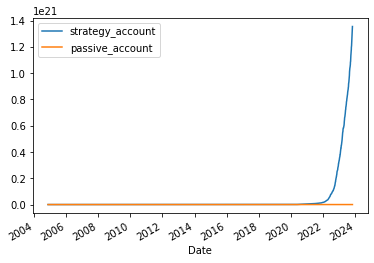

In [299]:
X_traintest_dt['strategy_return'] = X_traintest_dt["signal"] * Y
X_traintest_dt['strategy_account'] = X_traintest_dt['strategy_return'].cumsum().apply(np.exp) * capital
X_traintest_dt['passive_account'] = Y.cumsum().apply(np.exp) * capital

fig, ax1 = plt.subplots()
X_traintest_dt['strategy_account'].plot(ax=ax1, label='strategy_account')
X_traintest_dt['passive_account'].plot(ax=ax1, label='passive_account')
ax1.legend()

print('strategy final balance = ', X_traintest_dt['strategy_account'].dropna()[-1])

<font color = 'red'>

> elastic net
- independet var
    - raw = Y
    - Y_traintest
    - Y_traintest_binary
    
- predicted
    - EN_pred_train2 (non-binary)
    - EN_pred_train2_df (binary)
    - binary = Y_pred_logistic2_df
        - elasticNet + logisticRegression 
            - long only --> (store in 'res1') highest balance 1.005e+07, degree 2, k 15, alpha 0.1, penalty 0
            - long short --> (store in 'res2') highest balance 3.03e+07, degree 3, k 5, alpha 0.2, penalty 0.1
     

- indepedent var 
    - raw  = X
    - X_traintest
    - PolynomialFeatures = X_poly_df
    - kmeans = X_selected_df

- index = index_
    
- 4771
- 2004-11-17 to 2023-10-31
    
- stacking models: to correct error in model1, feed model1 prediction into model2
    - elastic net: benefit from regularisation
    - logistic regression: benefit from
        - specialisation in binary task
        - make use of performance metrics (e.g. accuracy, precision, recall)
    
> cart 
- x var (data from diff years) = df_dict
- Y
    - predicted (long short): DT_pred_train2
        - 100% overfitting, mse=0, strategy final balance = 1.3544955853277257e+21